In [ ]:
!pip install --upgrade git+https://github.com/EmGarr/od.git
# Useful for tensorboard
!pip install --upgrade grpcio

In [ ]:
#%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

# Download Pascal VOC

Download and preprocess Pascal VOC to the following format (required by od networks):

```python
dataset = {
        'images' : A tensor of float32 and shape [1, height, widht, 3],
        'images_info': A tensor of float32 and shape [1, 2] ,
        'bbox': A tensor of float32 and shape [1, num_boxes, 4],
        'labels': A tensor of int32 and shape [1, num_boxes],
        'num_boxes': A tensor of int32 and shape [1, 1],
        'weights': A tensor of float32 and shape [1, num_boxes]
    }

```

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
from kerod.dataset.preprocessing import preprocess, expand_dims_for_single_batch

ds_train, ds_info = tfds.load(name="voc", split="train", shuffle_files=True, with_info=True)
ds_train = ds_train.map(preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_train = ds_train.map(expand_dims_for_single_batch, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_train = ds_train.prefetch(tf.data.experimental.AUTOTUNE)

ds_test = tfds.load(name="voc", split="test", shuffle_files=False)
ds_test = ds_test.map(preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_test = ds_test.map(expand_dims_for_single_batch, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_test = ds_test.prefetch(tf.data.experimental.AUTOTUNE)

## Create an iterator on a small subset of the dataset

In [2]:
# Create an iterator to feed to tensorflow dataset
train_tf = ([x for x in ds_train.take(1)])
ds_train = tf.data.Dataset.from_generator(
    lambda: train_tf,
    ({
        "images": tf.float32,
        "images_information": tf.float32
    }, {
        "bbox": tf.float32,
        "label": tf.int32,
        "num_boxes": tf.int32,
        "weights": tf.float32
    }),
    output_shapes=(
        {
            "images": tf.TensorShape((1, None, None, 3)),
            "images_information": tf.TensorShape((1, 2))
        },
        {
            "bbox": tf.TensorShape((1, None, 4)),
            "label": tf.TensorShape((1, None)),
            "num_boxes": tf.TensorShape((1, 1)),
            "weights": tf.TensorShape((1, None))
        },
    ),
)


    

# Load and train the network

Perfom an overfit

In [3]:
from kerod.core.standard_fields import BoxField
from kerod.core.learning_rate_schedule import WarmupLearningRateScheduler
from kerod.model import factory

from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint
# Number of classes of Pascal Voc
classes = ds_info.features['labels'].names
num_classes = len(classes)

model_faster_rcnn = factory.build_model(num_classes)
base_lr = 0.02
optimizer = tf.keras.optimizers.SGD(learning_rate=base_lr)
model_faster_rcnn.compile(optimizer=optimizer, loss=None)

callbacks = [WarmupLearningRateScheduler(base_lr, 1, epochs=[8, 10], init_lr=0.0001)]

model_faster_rcnn.fit(ds_train, epochs=200, callbacks=callbacks)

Epoch 1/200


/home/egarreau/.pyenv/versions/3.6.6/envs/tensorflow/lib/python3.6/site-packages/tensorflow/python/framework/indexed_slices.py:434: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


1/1 [==============================] - 0s 27ms/step - loss: 3.5220 - rpn_recall: 1.0000 - region_proposal_network_classification_loss: 0.7596 - region_proposal_network_localization_loss: 0.0065 - accuracy: 0.1992 - fg_accuracy: 0.0000e+00 - false_negative: 0.0000e+00 - fast_rcnn_classification_loss: 2.6954 - fast_rcnn_localization_loss: 2.0844e-05
Epoch 2/200
1/1 [==============================] - 0s 2ms/step - loss: 0.3687 - rpn_recall: 1.0000 - region_proposal_network_classification_loss: 0.1940 - region_proposal_network_localization_loss: 0.0047 - accuracy: 0.9883 - fg_accuracy: 0.0000e+00 - false_negative: 1.0000 - fast_rcnn_classification_loss: 0.1073 - fast_rcnn_localization_loss: 0.0020
Epoch 3/200
1/1 [==============================] - 0s 2ms/step - loss: 0.3716 - rpn_recall: 1.0000 - region_proposal_network_classification_loss: 0.1972 - region_proposal_network_localization_loss: 0.0046 - accuracy: 0.9883 - fg_accuracy: 0.0000e+00 - false_negative: 1.0000 - fast_rcnn_classifica

KeyboardInterrupt: 

## Visualize overfit

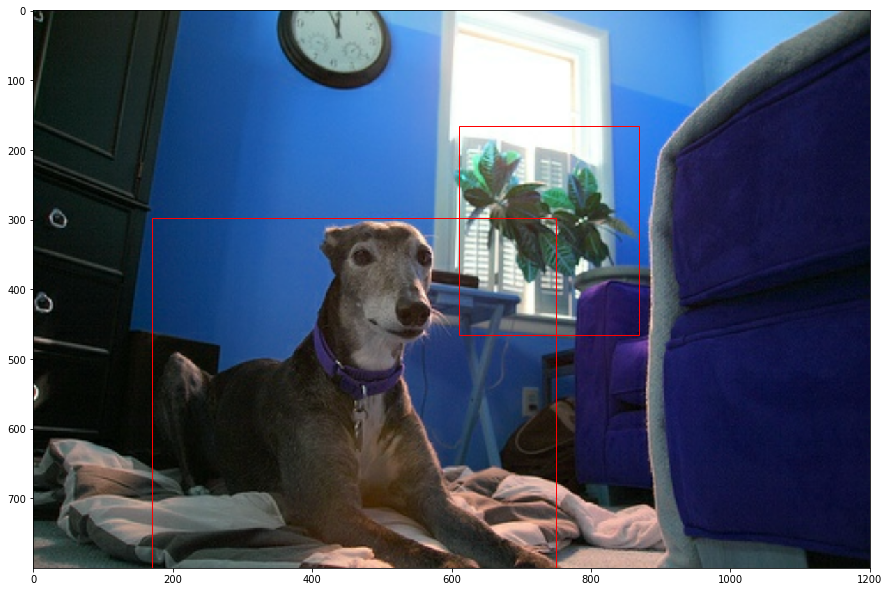

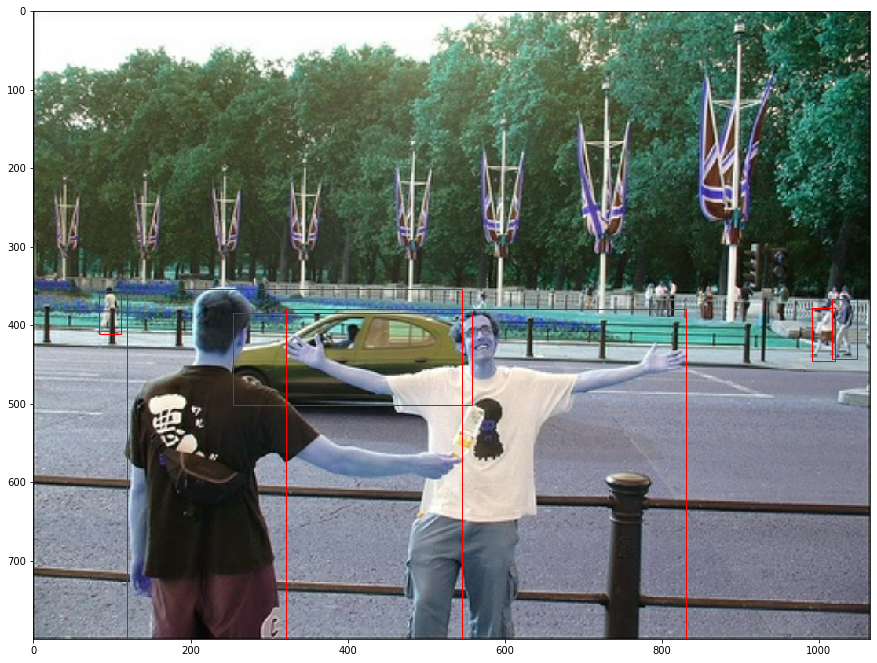

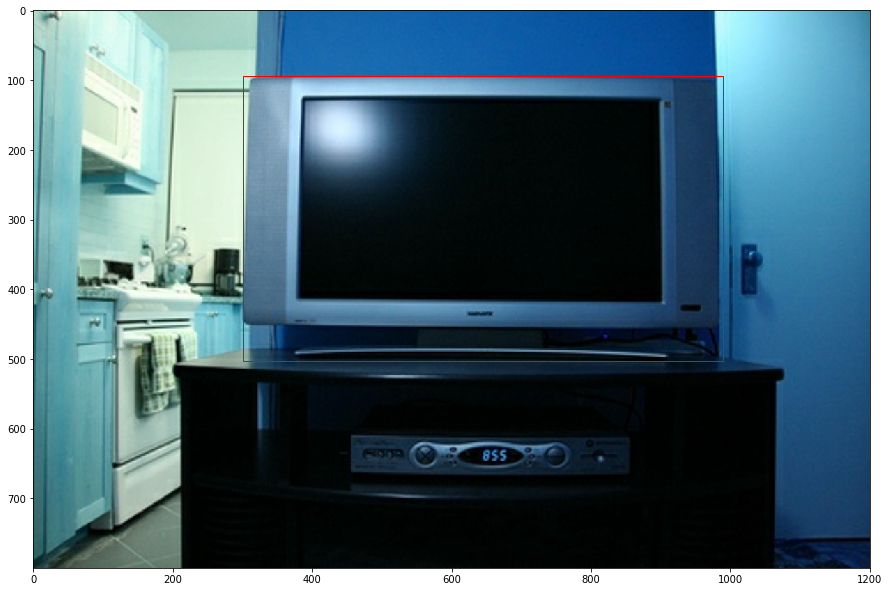

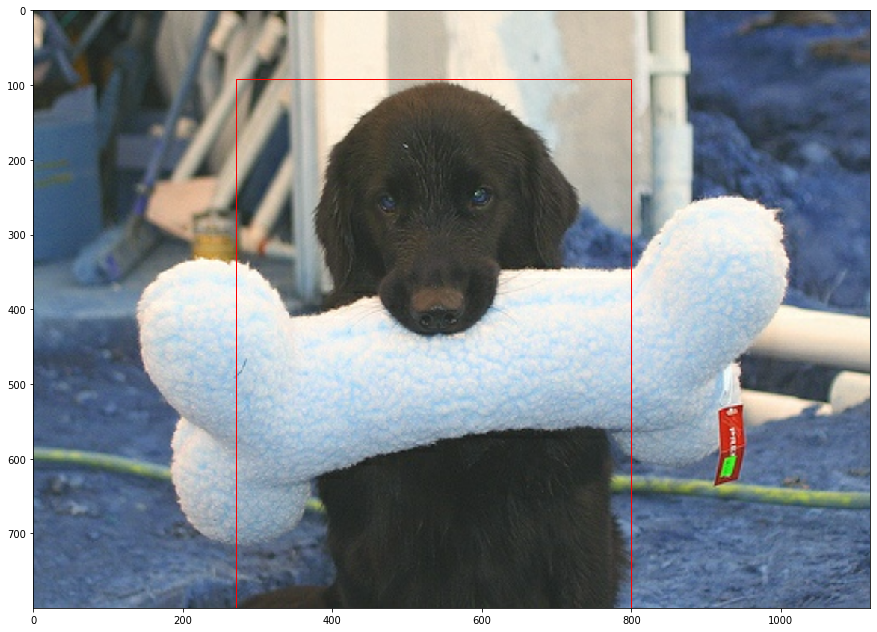

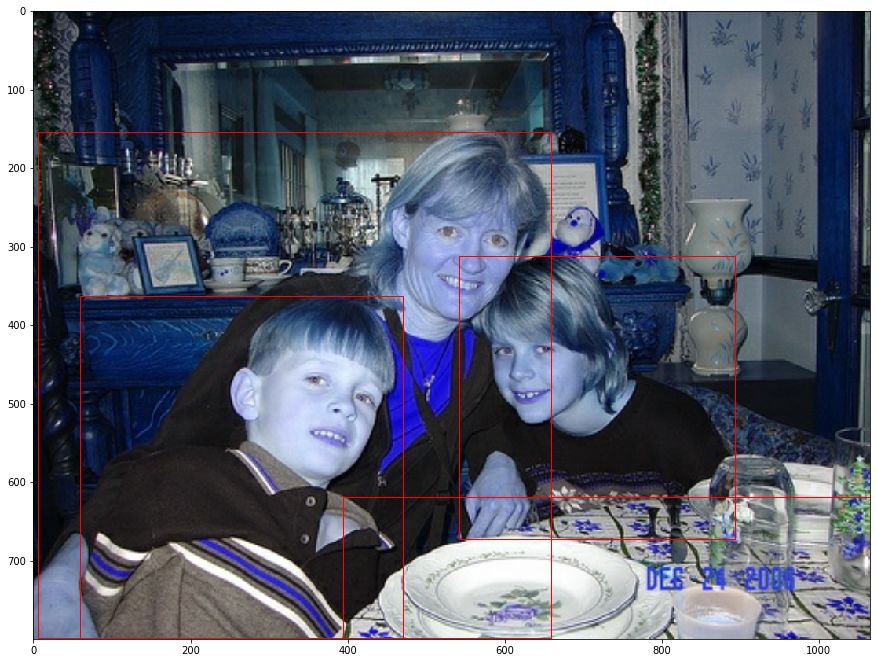

...

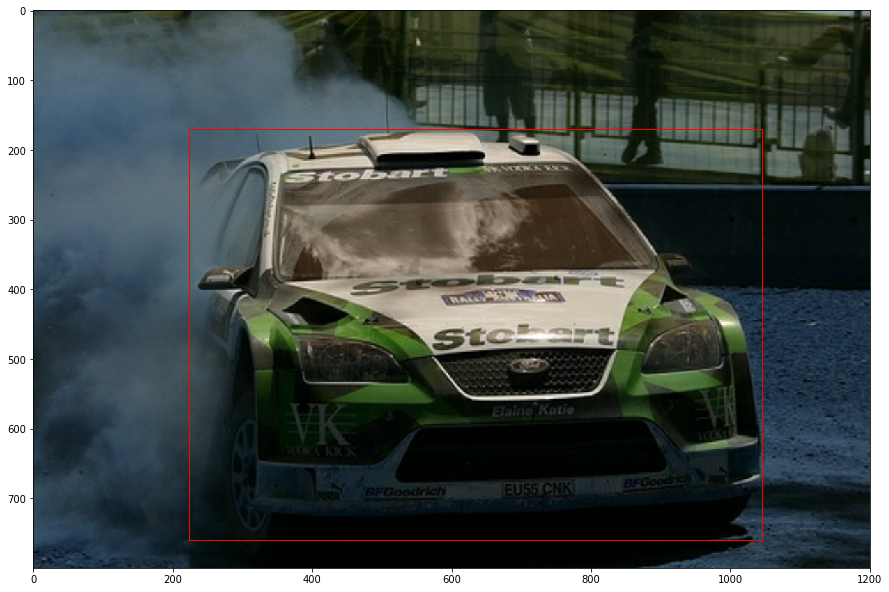

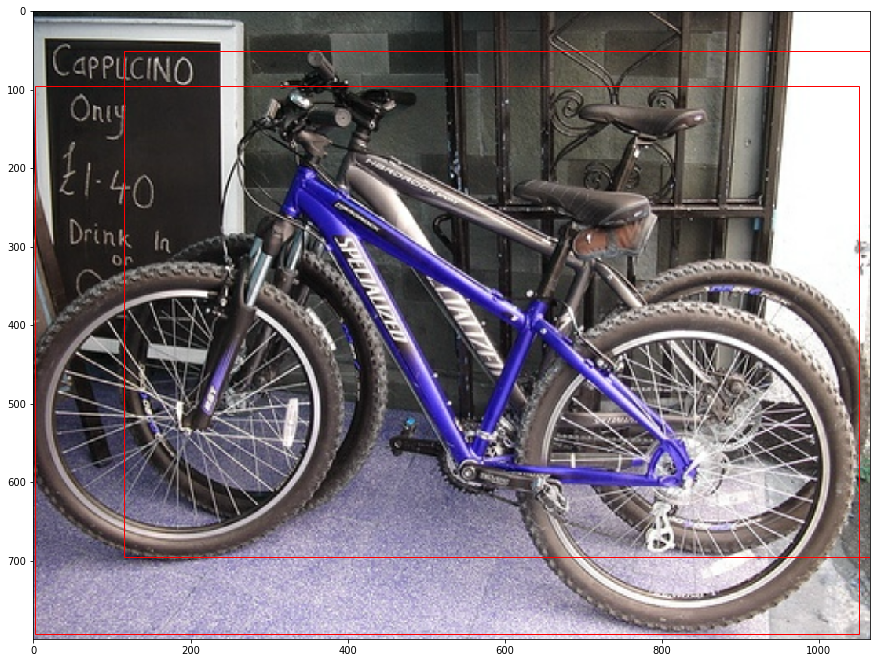

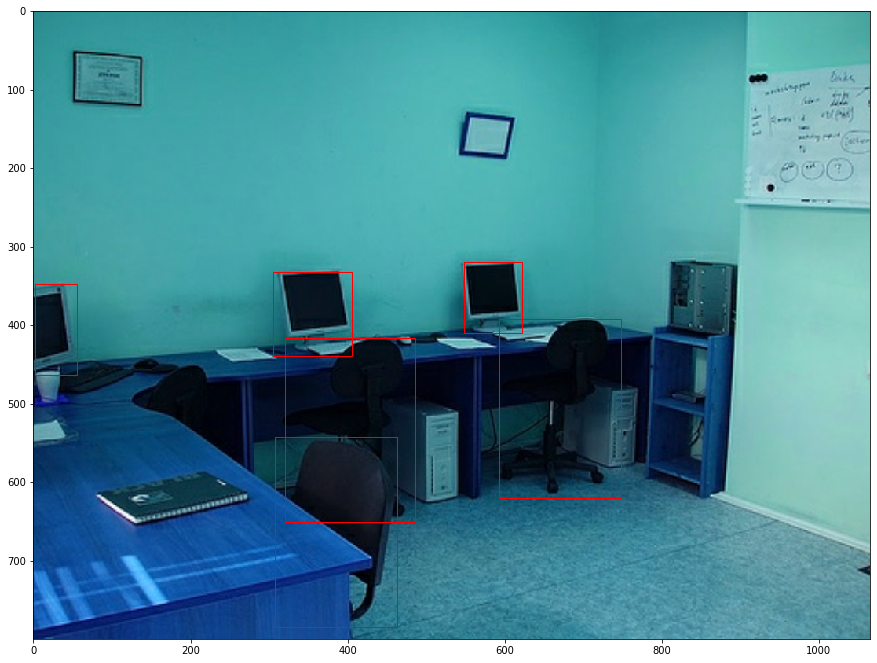

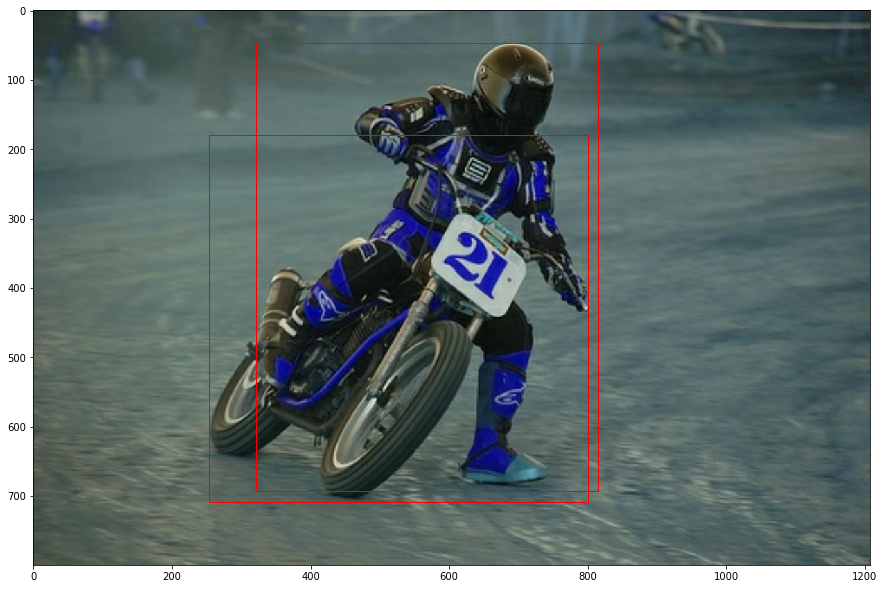

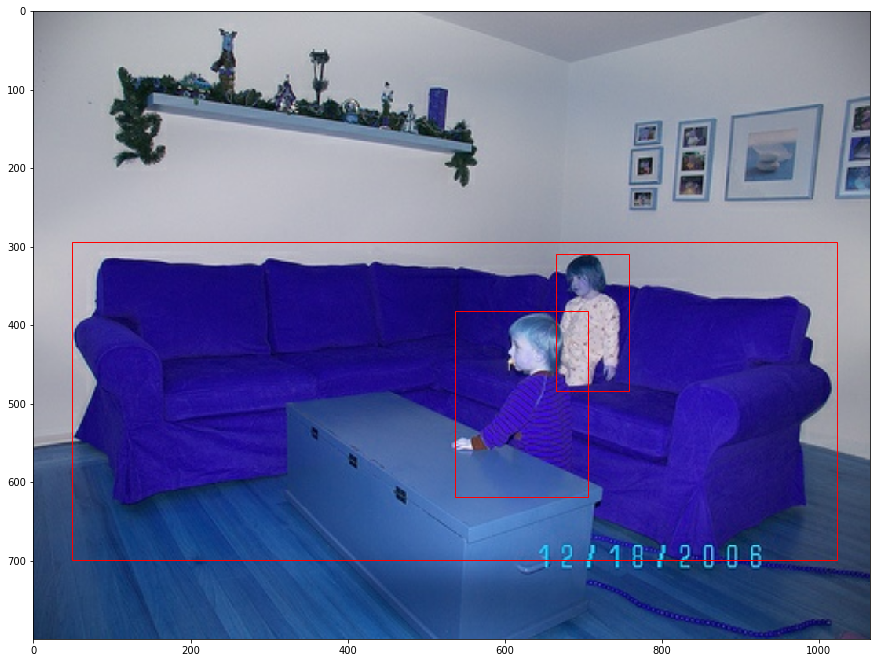

In [4]:
from od.utils.drawing import BoxDrawer, draw_bounding_boxes

for i, example in enumerate(ds_test):
    draw_bounding_boxes(example['images'][0],
                example['bbox'][0],
                resize=False)
    if i==10:
        break

In [11]:
anchors = [1, 2, 3]
anchors = [anchors for anchors in anchors]

In [12]:
anchors

[1, 2, 3]

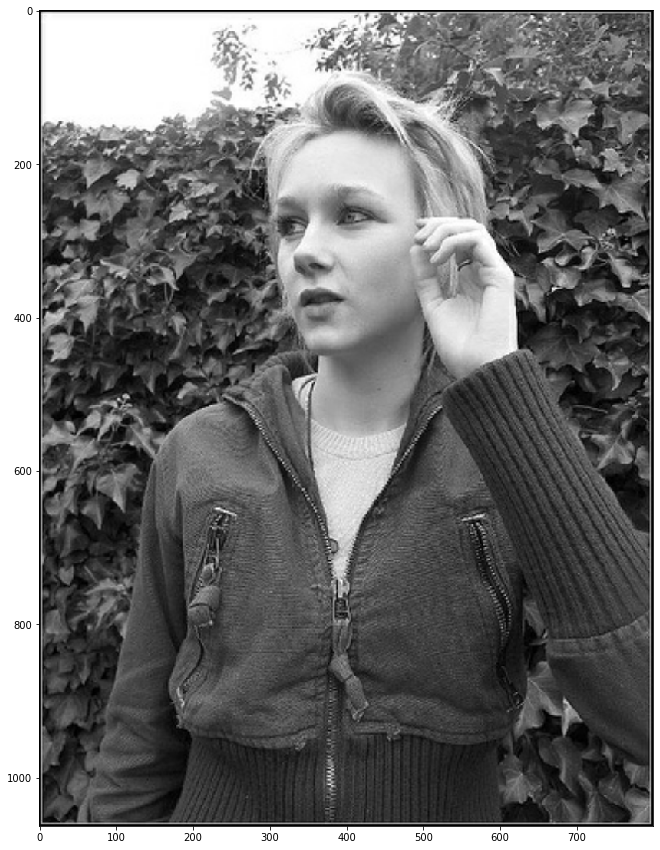

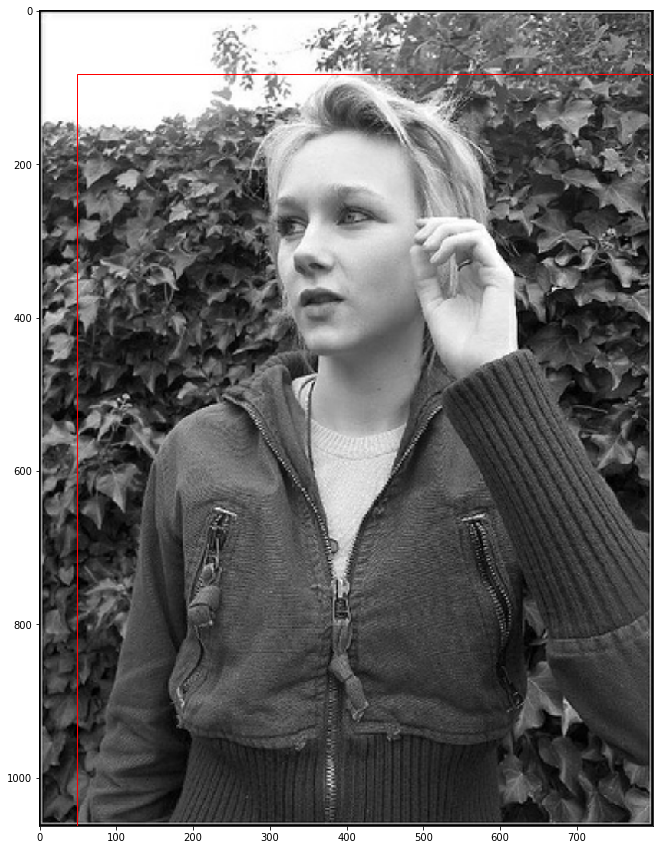

In [6]:
from kerod.utils.drawing import BoxDrawer, draw_bounding_boxes

drawer = BoxDrawer(classes)

for example in ds_train:
    out = model_faster_rcnn.predict_on_batch(example[0])
    boxes, scores, labels, valid_detections = out
    drawer(
        example[0]['images'],
        boxes,
        scores=scores,
        labels=labels,
        num_valid_detections=valid_detections
    )
    draw_bounding_boxes(example[0]['images'][0],
                example[1]['bbox'][0],
                resize=False)

In [ ]:
import pdb; pdb.set_trace()

--Call--
> /home/egarreau/.pyenv/versions/3.6.6/envs/tensorflow/lib/python3.6/site-packages/IPython/core/displayhook.py(252)__call__()
-> def __call__(self, result=None):
(Pdb) list
247  	    def finish_displayhook(self):
248  	        """Finish up all displayhook activities."""
249  	        sys.stdout.write(self.shell.separate_out2)
250  	        sys.stdout.flush()
251  	
252  ->	    def __call__(self, result=None):
253  	        """Printing with history cache management.
254  	
255  	        This is invoked every time the interpreter needs to print, and is
256  	        activated by setting the variable sys.displayhook to it.
257  	        """
(Pdb) inputs
*** NameError: name 'inputs' is not defined


# Check overfit

To check the overfit it is easier to use the eager mode instead of the classical.

In [5]:
from kerod.core.standard_fields import BoxField
from kerod.core.learning_rate_schedule import WarmupLearningRateScheduler
from kerod.model import factory

from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint
# Number of classes of Pascal Voc
classes = ds_info.features['labels'].names
num_classes = len(classes)

model_faster_rcnn = factory.build_model(num_classes)

In [3]:
from tensorflow.keras.applications import ResNet50

In [4]:
resnet = ResNet50(input_shape=[224, 224, 3], include_top=False)

In [6]:
name_to_layer = {layer.name: layer for layer in model_faster_rcnn.resnet.layers}

In [7]:
resnet_to_layer= {layer.name: layer for layer in resnet.layers}


In [8]:
name = 'conv3_block1_1_conv'

In [9]:
weights_resnet = resnet_to_layer[name].weights[0].numpy()
weights_frcnn = name_to_layer[name].weights[0].numpy()

In [10]:
import numpy as np
np.testing.assert_array_equal(weights_frcnn, weights_resnet)